In [63]:
import os
import pandas as pd
import numpy as np
import alphalens as al
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.feature_selection import f_regression
from sklearn.feature_selection import SelectKBest

import warnings
warnings.filterwarnings('ignore')

In [73]:
df_factor = pd.read_table('D:/Desktop/厚方 投资建模/merged_daily_freq_factor_cleaned.txt',sep=',')
df_factor = df_factor.drop(columns = [ 'S_DQ_PRECLOSE', 'S_DQ_OPEN' , 'S_DQ_HIGH' , 'S_DQ_LOW' ,'S_DQ_AVGPRICE', 'S_DQ_VOLUME'])
print(df_factor.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353122 entries, 0 to 353121
Data columns (total 20 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   S_INFO_WINDCODE              353122 non-null  object 
 1   TRADE_DT                     353122 non-null  int64  
 2   S_DQ_CLOSE                   353122 non-null  float64
 3   S_VAL_PE                     353122 non-null  float64
 4   S_VAL_PB_NEW                 353122 non-null  float64
 5   S_VAL_PS                     353122 non-null  float64
 6   S_DQ_TURN                    353122 non-null  float64
 7   S_DQ_MV                      353122 non-null  float64
 8   NET_ASSETS_TODAY             353122 non-null  float64
 9   NET_PROFIT_PARENT_COMP_TTM   353122 non-null  float64
 10  NET_CASH_FLOWS_OPER_ACT_TTM  353122 non-null  float64
 11  OPER_REV_TTM                 353122 non-null  float64
 12  Variance20                   353122 non-null  float64
 13 

In [91]:
df_value_factor = df_factor.iloc[:,:9]
df_basic_ttm = df_factor.iloc[:,[0,1,2,9,10,11]]
df_risk_factor = df_factor.iloc[:,[0,1,2,12,13,14,15]]
df_trade_factor = df_factor.iloc[:,[0,1,2,16,17,18,19]]

value_factor_list = ['S_VAL_PE', 'S_VAL_PB_NEW', 'S_VAL_PS', 'S_DQ_TURN', 'S_DQ_MV', 'NET_ASSETS_TODAY']
basic_ttm_list = ['NET_PROFIT_PARENT_COMP_TTM', 'NET_CASH_FLOWS_OPER_ACT_TTM', 'OPER_REV_TTM']
risk_factor_list = ['Variance20', 'Skewness20', 'Kurtosis20', 'SharpeRatio20']
trade_factor_list = ['VOL20', 'VSTD20', 'TVMA20', 'WVAD']

In [92]:
def heatmap(df):
    df_corr = df.corr()
    sns.heatmap(df_corr, vmin=0, vmax=1, annot=True, square=True, cmap='Oranges')
    plt.show()

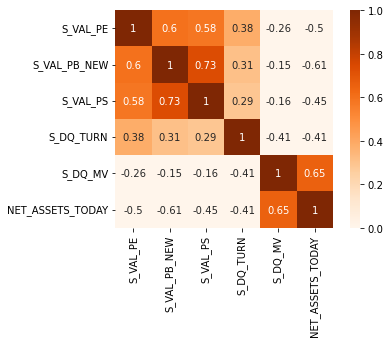

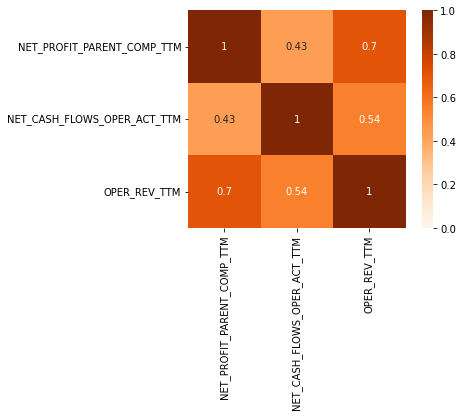

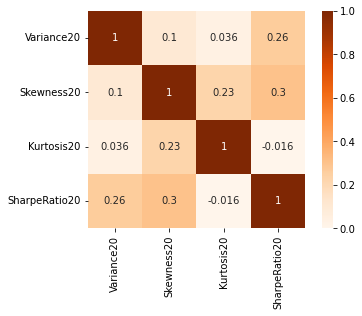

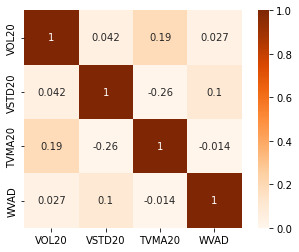

In [93]:
heatmap(df=df_value_factor[value_factor_list])
heatmap(df=df_basic_ttm[basic_ttm_list])
heatmap(df=df_risk_factor[risk_factor_list])
heatmap(df=df_trade_factor[trade_factor_list])

In [102]:
select = SelectKBest(
    f_regression,
    k=4
)

feature = df_value_factor[value_factor_list]

selectFeature = select.fit_transform(
    feature,
    df_value_factor['S_DQ_CLOSE']
)

feature.columns[select.get_support()]


Index(['S_VAL_PE', 'S_VAL_PB_NEW', 'S_VAL_PS', 'NET_ASSETS_TODAY'], dtype='object')

In [107]:
select = SelectKBest(
    f_regression,
    k=2
)

feature = df_basic_ttm[basic_ttm_list]

selectFeature = select.fit_transform(
    feature,
    df_basic_ttm['S_DQ_CLOSE']
)

feature.columns[select.get_support()]

Index(['NET_PROFIT_PARENT_COMP_TTM', 'OPER_REV_TTM'], dtype='object')

In [108]:
select = SelectKBest(
    f_regression,
    k=2
)

feature = df_risk_factor[risk_factor_list]

selectFeature = select.fit_transform(
    feature,
    df_risk_factor['S_DQ_CLOSE']
)

feature.columns[select.get_support()]

Index(['Variance20', 'SharpeRatio20'], dtype='object')

In [109]:
select = SelectKBest(
    f_regression,
    k=2
)

feature = df_trade_factor[trade_factor_list]

selectFeature = select.fit_transform(
    feature,
    df_trade_factor['S_DQ_CLOSE']
)

feature.columns[select.get_support()]

Index(['VSTD20', 'TVMA20'], dtype='object')

In [111]:
def Get_Info(data,factor_list):
    data['TRADE_DT'] = data['TRADE_DT'].astype(str)
    data['TRADE_DT'] = data['TRADE_DT'].str[:4]+'-'+data['TRADE_DT'].str[4:6]+'-'+data['TRADE_DT'].str[6:8]
    data['TRADE_DT'] = pd.to_datetime(data['TRADE_DT'])

    data.set_index('TRADE_DT', inplace=True)
    data.sort_index(inplace=True)

    factor = data.set_index([data.index, data['S_INFO_WINDCODE']], drop=True)
    close = data.pivot_table(index='TRADE_DT', columns='S_INFO_WINDCODE', values='S_DQ_CLOSE')
    for fac in factor_list:
        print(f'------------------{fac} information------------------')
        factor_data = al.utils.get_clean_factor_and_forward_returns(factor[[fac]], close)
        al.tears.create_information_tear_sheet(factor_data, group_neutral=False)
        print('--------------------------------------------------------\n')

------------------S_VAL_PE information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,0.001,0.013,0.018
IC Std.,0.241,0.252,0.253
Risk-Adjusted IC,0.004,0.051,0.073
t-stat(IC),0.148,1.856,2.633
p-value(IC),0.882,0.064,0.009
IC Skew,-0.026,-0.194,-0.235
IC Kurtosis,-0.526,-0.599,-0.543


<Figure size 432x288 with 0 Axes>

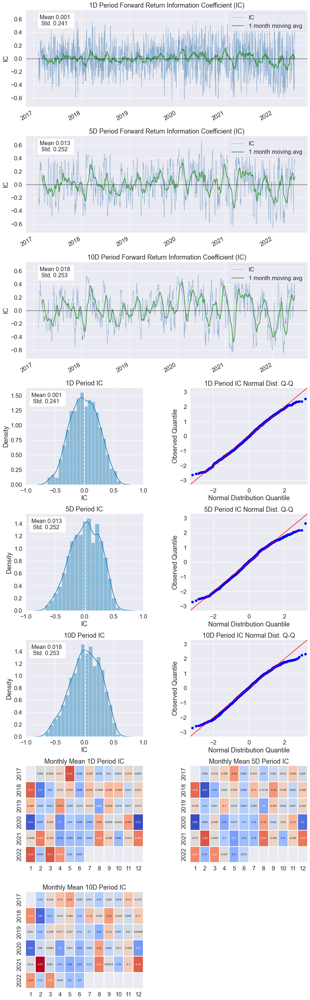

--------------------------------------------------------

------------------S_VAL_PB_NEW information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,0.006,0.028,0.039
IC Std.,0.258,0.275,0.282
Risk-Adjusted IC,0.023,0.101,0.137
t-stat(IC),0.830,3.652,4.947
p-value(IC),0.407,0.000,0.000
IC Skew,-0.128,-0.319,-0.358
IC Kurtosis,-0.500,-0.458,-0.415


<Figure size 432x288 with 0 Axes>

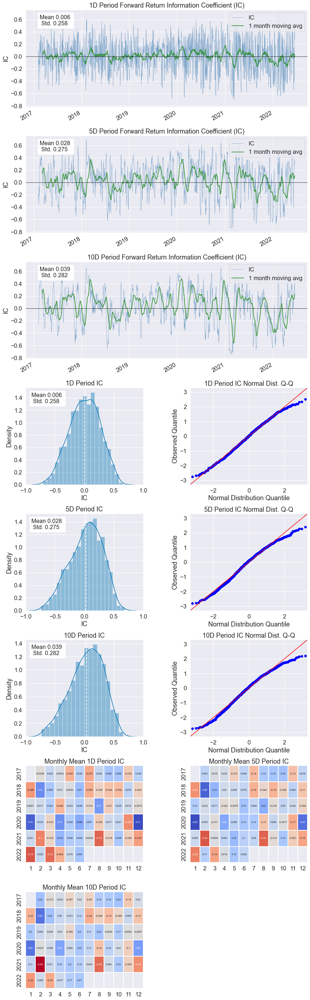

--------------------------------------------------------

------------------S_VAL_PS information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,0.006,0.016,0.021
IC Std.,0.203,0.216,0.223
Risk-Adjusted IC,0.031,0.074,0.092
t-stat(IC),1.111,2.692,3.320
p-value(IC),0.267,0.007,0.001
IC Skew,-0.164,-0.324,-0.346
IC Kurtosis,-0.271,-0.190,-0.169


<Figure size 432x288 with 0 Axes>

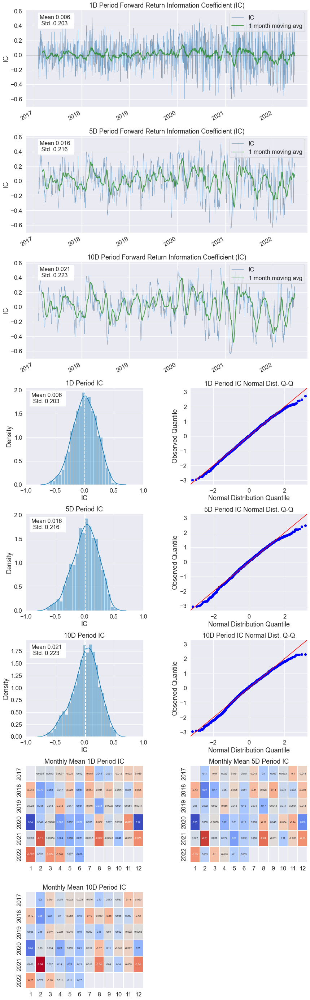

--------------------------------------------------------

------------------S_DQ_TURN information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.012,-0.004,-0.000
IC Std.,0.215,0.218,0.218
Risk-Adjusted IC,-0.057,-0.019,-0.002
t-stat(IC),-2.076,-0.683,-0.069
p-value(IC),0.038,0.495,0.945
IC Skew,0.142,-0.021,-0.052
IC Kurtosis,-0.438,-0.721,-0.692


<Figure size 432x288 with 0 Axes>

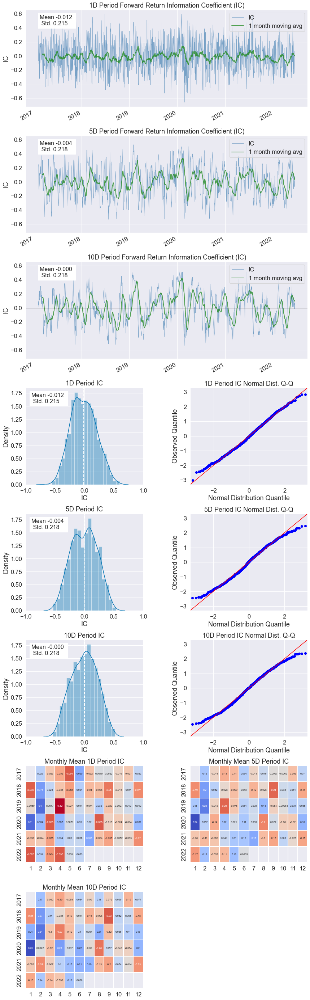

--------------------------------------------------------

------------------S_DQ_MV information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.003,-0.020,-0.033
IC Std.,0.176,0.187,0.183
Risk-Adjusted IC,-0.018,-0.107,-0.182
t-stat(IC),-0.669,-3.875,-6.593
p-value(IC),0.504,0.000,0.000
IC Skew,-0.003,0.033,-0.031
IC Kurtosis,0.301,0.150,0.386


<Figure size 432x288 with 0 Axes>

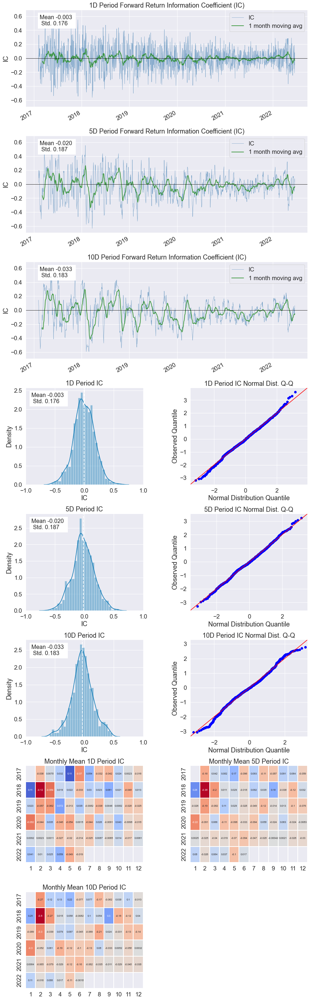

--------------------------------------------------------

------------------NET_ASSETS_TODAY information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.009,-0.036,-0.052
IC Std.,0.249,0.266,0.270
Risk-Adjusted IC,-0.035,-0.134,-0.192
t-stat(IC),-1.272,-4.855,-6.930
p-value(IC),0.204,0.000,0.000
IC Skew,0.019,0.143,0.150
IC Kurtosis,-0.590,-0.758,-0.632


<Figure size 432x288 with 0 Axes>

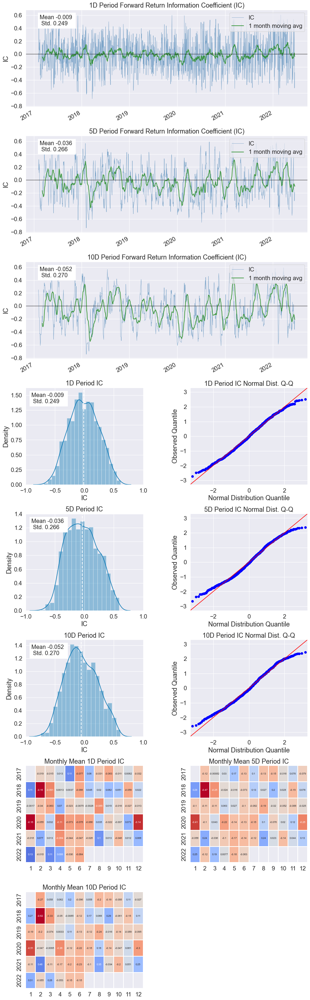

--------------------------------------------------------



In [113]:
Get_Info(df_value_factor,value_factor_list)

------------------NET_PROFIT_PARENT_COMP_TTM information------------------
Dropped 4.2% entries from factor data: 0.8% in forward returns computation and 3.3% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.005,-0.025,-0.038
IC Std.,0.230,0.239,0.237
Risk-Adjusted IC,-0.021,-0.103,-0.159
t-stat(IC),-0.754,-3.653,-5.643
p-value(IC),0.451,0.000,0.000
IC Skew,-0.011,0.098,0.109
IC Kurtosis,-0.541,-0.780,-0.647


<Figure size 432x288 with 0 Axes>

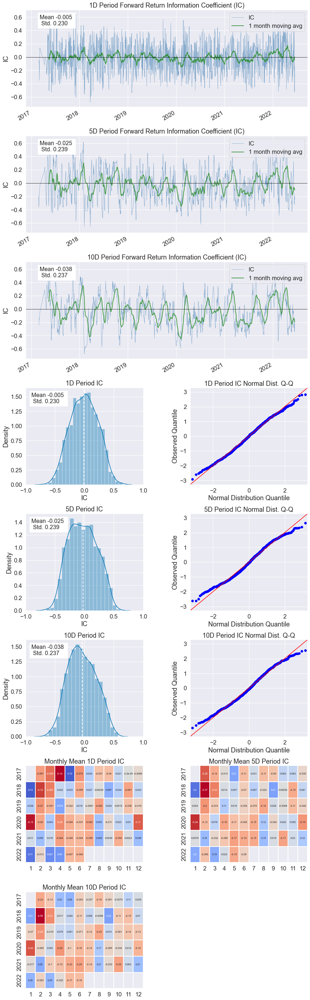

--------------------------------------------------------

------------------NET_CASH_FLOWS_OPER_ACT_TTM information------------------
Dropped 58.0% entries from factor data: 0.8% in forward returns computation and 57.2% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).


MaxLossExceededError: max_loss (35.0%) exceeded 58.0%, consider increasing it.

In [114]:
Get_Info(df_basic_ttm,basic_ttm_list)

------------------Variance20 information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.002,0.011,0.019
IC Std.,0.235,0.235,0.232
Risk-Adjusted IC,-0.010,0.048,0.081
t-stat(IC),-0.347,1.727,2.920
p-value(IC),0.729,0.084,0.004
IC Skew,0.098,-0.070,-0.121
IC Kurtosis,-0.489,-0.717,-0.576


<Figure size 432x288 with 0 Axes>

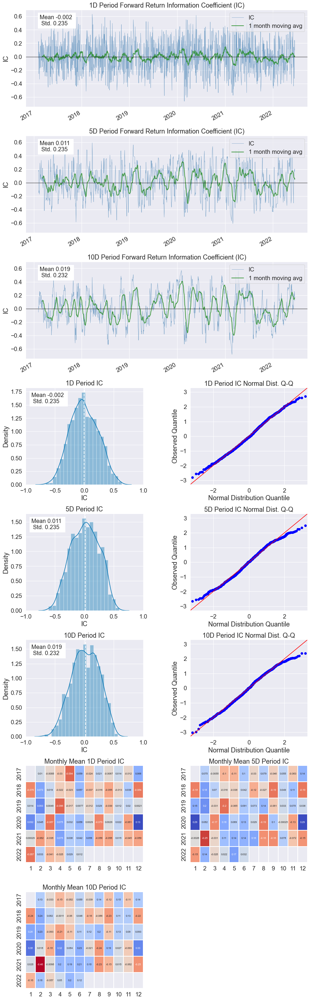

--------------------------------------------------------

------------------Skewness20 information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,0.003,0.008,0.007
IC Std.,0.115,0.113,0.112
Risk-Adjusted IC,0.029,0.071,0.062
t-stat(IC),1.065,2.580,2.237
p-value(IC),0.287,0.010,0.025
IC Skew,-0.089,-0.109,-0.066
IC Kurtosis,0.768,0.572,0.442


<Figure size 432x288 with 0 Axes>

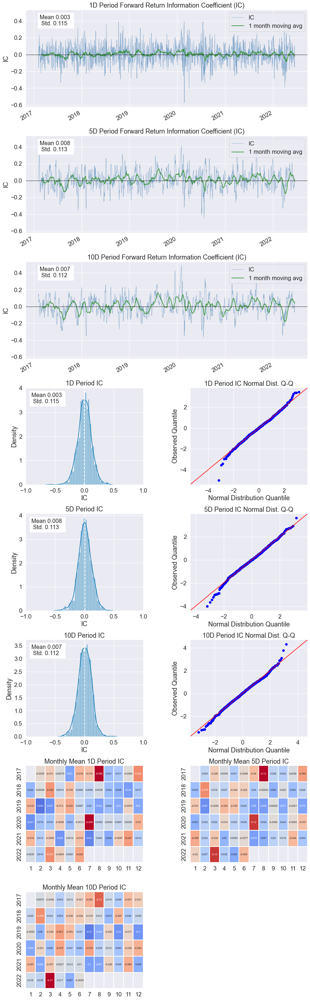

--------------------------------------------------------

------------------Kurtosis20 information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.001,0.006,0.014
IC Std.,0.099,0.094,0.092
Risk-Adjusted IC,-0.012,0.066,0.155
t-stat(IC),-0.423,2.388,5.609
p-value(IC),0.672,0.017,0.000
IC Skew,0.202,0.050,0.011
IC Kurtosis,1.367,1.126,1.896


<Figure size 432x288 with 0 Axes>

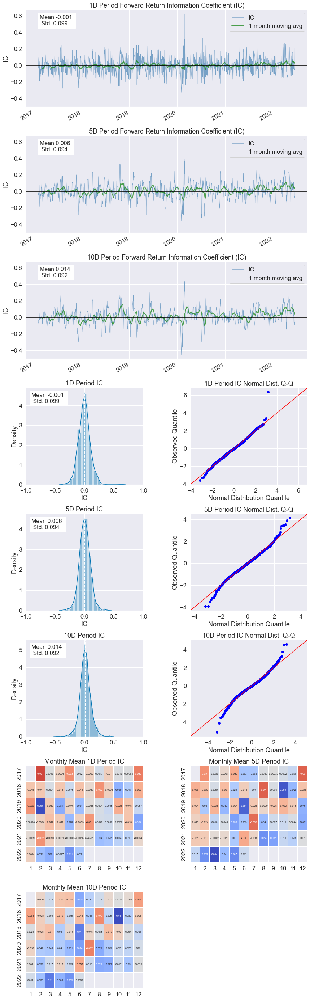

--------------------------------------------------------

------------------SharpeRatio20 information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.005,0.007,0.013
IC Std.,0.196,0.187,0.186
Risk-Adjusted IC,-0.024,0.036,0.070
t-stat(IC),-0.880,1.317,2.513
p-value(IC),0.379,0.188,0.012
IC Skew,-0.073,-0.296,-0.486
IC Kurtosis,-0.032,-0.075,-0.011


<Figure size 432x288 with 0 Axes>

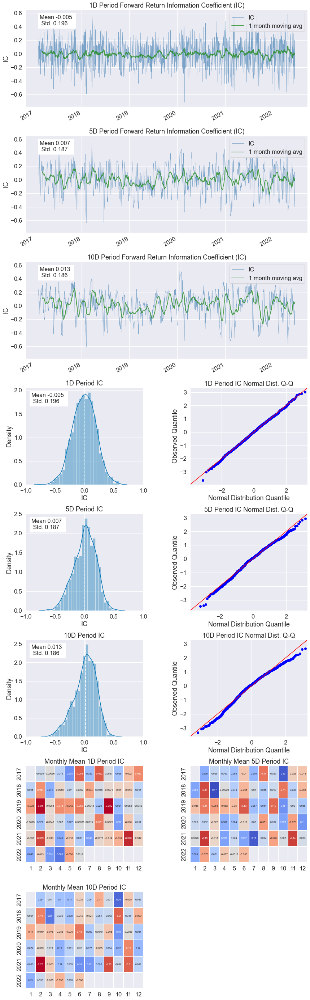

--------------------------------------------------------



In [115]:
Get_Info(df_risk_factor,risk_factor_list)

------------------VOL20 information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.009,-0.006,-0.005
IC Std.,0.224,0.229,0.230
Risk-Adjusted IC,-0.041,-0.027,-0.020
t-stat(IC),-1.499,-0.981,-0.707
p-value(IC),0.134,0.327,0.480
IC Skew,0.117,0.004,-0.006
IC Kurtosis,-0.493,-0.758,-0.734


<Figure size 432x288 with 0 Axes>

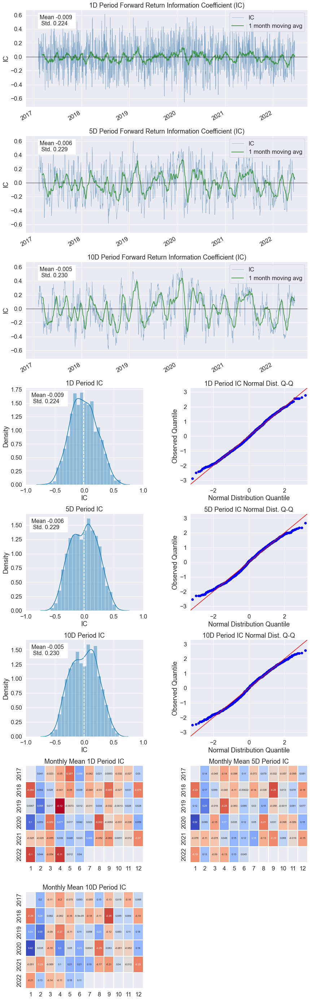

--------------------------------------------------------

------------------VSTD20 information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.017,-0.041,-0.054
IC Std.,0.184,0.200,0.208
Risk-Adjusted IC,-0.090,-0.203,-0.261
t-stat(IC),-3.245,-7.326,-9.426
p-value(IC),0.001,0.000,0.000
IC Skew,0.135,0.239,0.210
IC Kurtosis,-0.091,-0.320,-0.489


<Figure size 432x288 with 0 Axes>

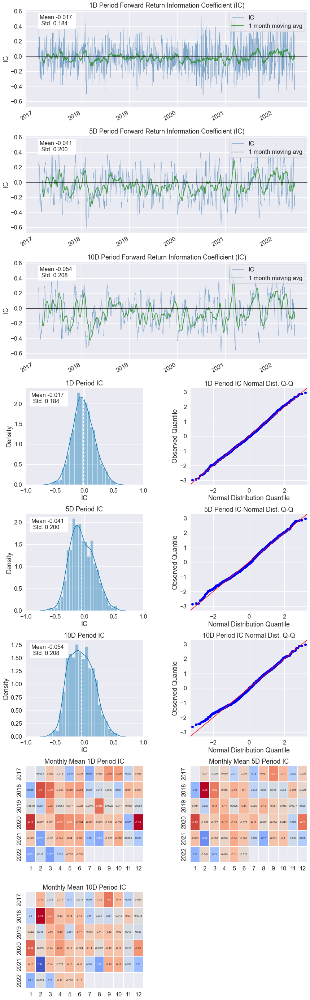

--------------------------------------------------------

------------------TVMA20 information------------------
Dropped 0.9% entries from factor data: 0.8% in forward returns computation and 0.1% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,0.005,0.015,0.022
IC Std.,0.137,0.147,0.149
Risk-Adjusted IC,0.037,0.106,0.147
t-stat(IC),1.325,3.812,5.312
p-value(IC),0.186,0.000,0.000
IC Skew,-0.044,-0.260,-0.279
IC Kurtosis,-0.136,-0.277,-0.269


<Figure size 432x288 with 0 Axes>

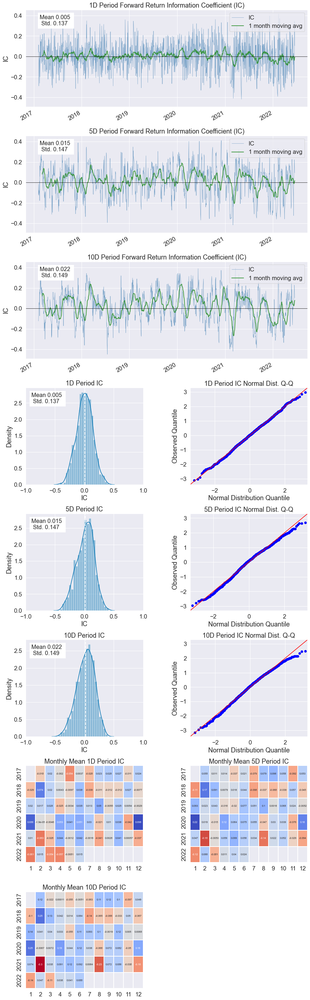

--------------------------------------------------------

------------------WVAD information------------------
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Information Analysis


,1D,5D,10D
IC Mean,-0.019,-0.003,0.008
IC Std.,0.167,0.161,0.158
Risk-Adjusted IC,-0.114,-0.020,0.050
t-stat(IC),-4.137,-0.729,1.821
p-value(IC),0.000,0.466,0.069
IC Skew,-0.134,-0.207,-0.237
IC Kurtosis,0.167,0.255,0.328


<Figure size 432x288 with 0 Axes>

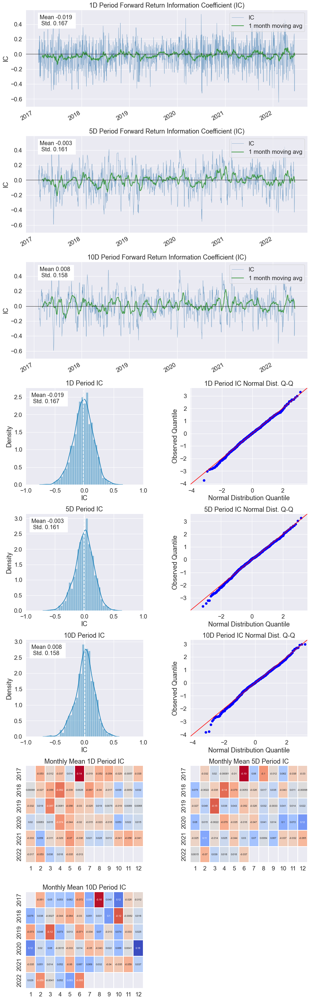

--------------------------------------------------------



In [116]:
Get_Info(df_trade_factor,trade_factor_list)